In [46]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import optimizers

import numpy as np
import matplotlib.pyplot as plt

In [47]:
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, width_shift_range=0.1, height_shift_range=0.1)

In [48]:
train_generator = train_datagen.flow_from_directory(
    '../data/desk/train/',
    target_size=(150,150),
    batch_size=5,
    class_mode='binary',
    shuffle=False
)

Found 600 images belonging to 2 classes.


In [49]:
train_generator.class_indices

{'clean': 0, 'dirty': 1}

In [50]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    '../data/desk/val/',
    target_size=(150,150),
    batch_size=5,
    class_mode='binary',
    shuffle=False
)

Found 108 images belonging to 2 classes.


In [51]:
# 전이학습

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Input, models, layers, optimizers, metrics
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np
import matplotlib.pyplot as plt

transfer_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

transfer_model.trainable = False
transfer_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

In [52]:
finetune_model = models.Sequential()
finetune_model.add(transfer_model)
finetune_model.add(Flatten())
finetune_model.add(Dense(64))
finetune_model.add(Activation('relu'))
finetune_model.add(Dropout(0.5))
finetune_model.add(Dense(1))
finetune_model.add(Activation('sigmoid'))
finetune_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 8192)              0         
                                                                 
 dense_2 (Dense)             (None, 64)                524352    
                                                                 
 activation_2 (Activation)   (None, 64)                0         
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
 activation_3 (Activation)   (None, 1)                

In [53]:
import tensorflow as tf

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor = "accuracy",
    patience = 2,
    verbose = 1,
    factor = 0.5,
    min_lr = 0.000000001
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor = "accuracy",
    patience = 10,
    verbose = 1,
    mode = "max",
)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
    monitor = "accuracy",
    filepath = "../model/desk_vgg_transfer_.{epoch:02d}-{accuracy:.6f}.hdf5",
    verbose = 1,
    save_best_only = True,
    save_weights_only = True
)

In [54]:
finetune_model.compile(loss='binary_crossentropy',
                       optimizer=optimizers.Adam(learning_rate=0.0002),
                       metrics=['accuracy']
)

history = finetune_model.fit(
    train_generator,
    epochs=20,
    validation_data=test_generator,
    validation_steps=10,
    callbacks = [reduce_lr, early_stopping, checkpoint]
)

Epoch 1/20
 94/120 [======================>.......] - ETA: 1s - loss: 0.6913 - accuracy: 0.6362

/home/yoh/venv/dl_study/lib/python3.10/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


120/120 [==============================] - ETA: 0s - loss: 0.6726 - accuracy: 0.6483
Epoch 1: accuracy improved from -inf to 0.64833, saving model to ../model/desk_vgg_transfer_.01-0.648333.hdf5
120/120 [==============================] - 10s 71ms/step - loss: 0.6726 - accuracy: 0.6483 - val_loss: 0.3236 - val_accuracy: 0.9400 - lr: 2.0000e-04
Epoch 2/20
120/120 [==============================] - ETA: 0s - loss: 0.5599 - accuracy: 0.7083
Epoch 2: accuracy improved from 0.64833 to 0.70833, saving model to ../model/desk_vgg_transfer_.02-0.708333.hdf5
120/120 [==============================] - 5s 44ms/step - loss: 0.5599 - accuracy: 0.7083 - val_loss: 0.5999 - val_accuracy: 0.6800 - lr: 2.0000e-04
Epoch 3/20
120/120 [==============================] - ETA: 0s - loss: 0.5011 - accuracy: 0.7517
Epoch 3: accuracy improved from 0.70833 to 0.75167, saving model to ../model/desk_vgg_transfer_.03-0.751667.hdf5
120/120 [==============================] - 5s 43ms/step - loss: 0.5011 - accuracy: 0.751

120/120 [==============================] - 10s 78ms/step


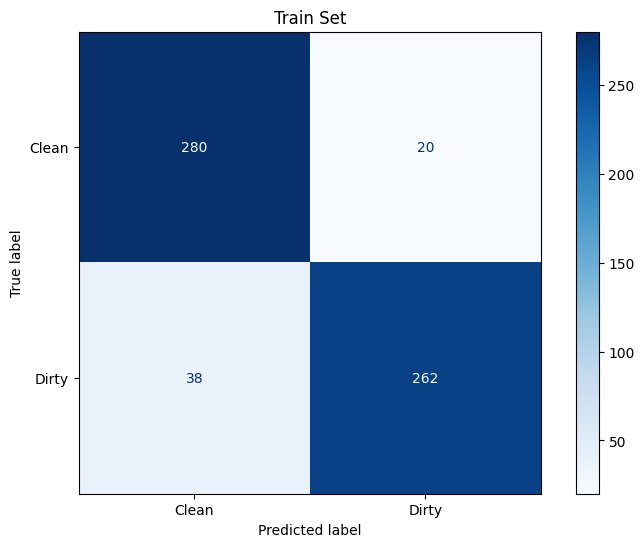

In [55]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

train_pred = (finetune_model.predict(train_generator) > 0.5).astype("int32")

fig, ax = plt.subplots(figsize = (9, 6))

cm = confusion_matrix(train_generator.classes, train_pred)

disp = ConfusionMatrixDisplay(confusion_matrix = cm,
                              display_labels = ["Clean", "Dirty"])

disp.plot(cmap = plt.cm.Blues, ax = ax)

ax.set_title("Train Set")

plt.show()

22/22 [==============================] - 1s 27ms/step


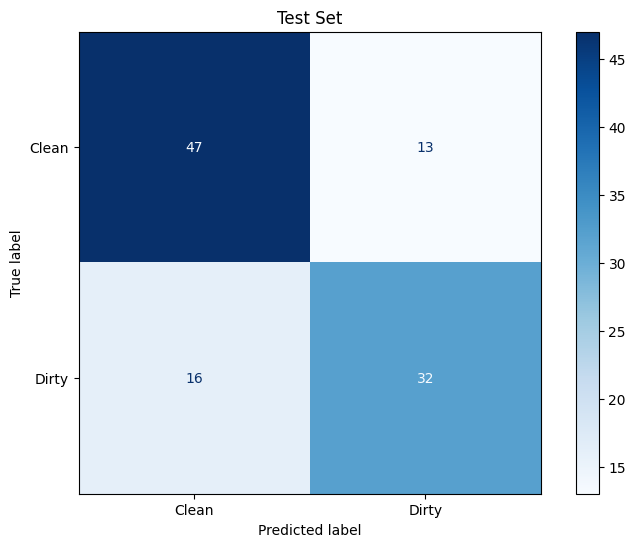

In [56]:
test_pred = (finetune_model.predict(test_generator) > 0.5).astype("int32")

fig, ax = plt.subplots(figsize = (9, 6))

cm = confusion_matrix(test_generator.classes, test_pred)

disp = ConfusionMatrixDisplay(confusion_matrix = cm,
                              display_labels = ["Clean", "Dirty"])

disp.plot(cmap = plt.cm.Blues, ax = ax)

ax.set_title("Test Set")

plt.show()

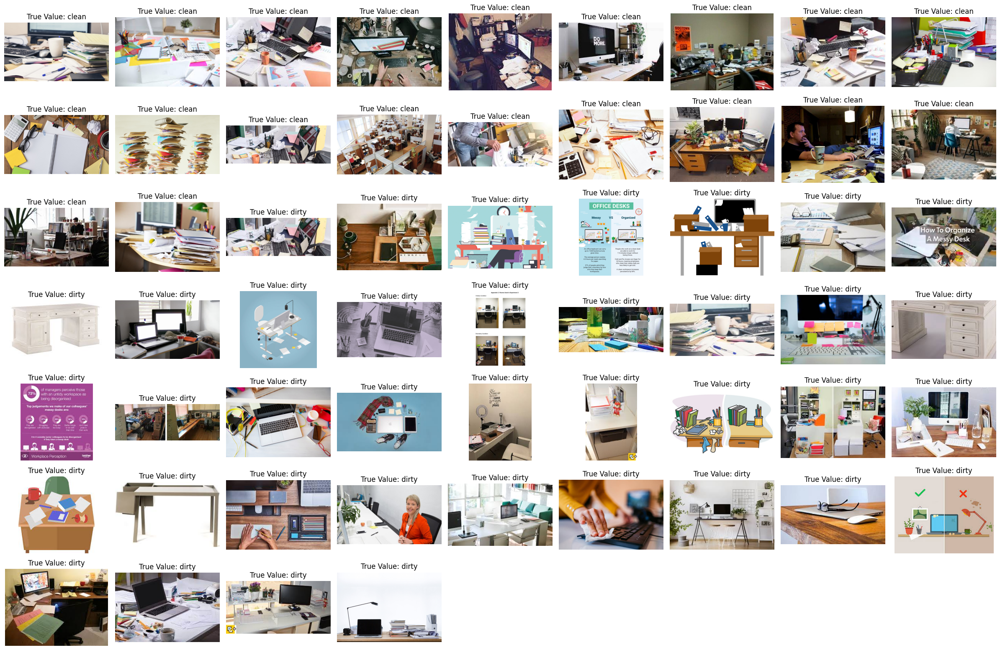

In [63]:
# train 데이터에서 틀린 것들

wrong_results = []

for i in range(len(train_generator.classes)):
    if train_generator.classes[i] != int(train_pred[i][0]):
        wrong_results.append(train_generator.filenames[i])

fig = plt.figure(1, figsize=(24,20))
cnt = 1
for filename in wrong_results:
    plt.subplot(9, 9, cnt)
    cnt += 1
    image = plt.imread('../data/desk/train/' + filename)
    plt.imshow(image)
    plt.axis('off')
    plt.title("True Value: "+ filename.split("/")[0])
    
plt.tight_layout()
plt.show()

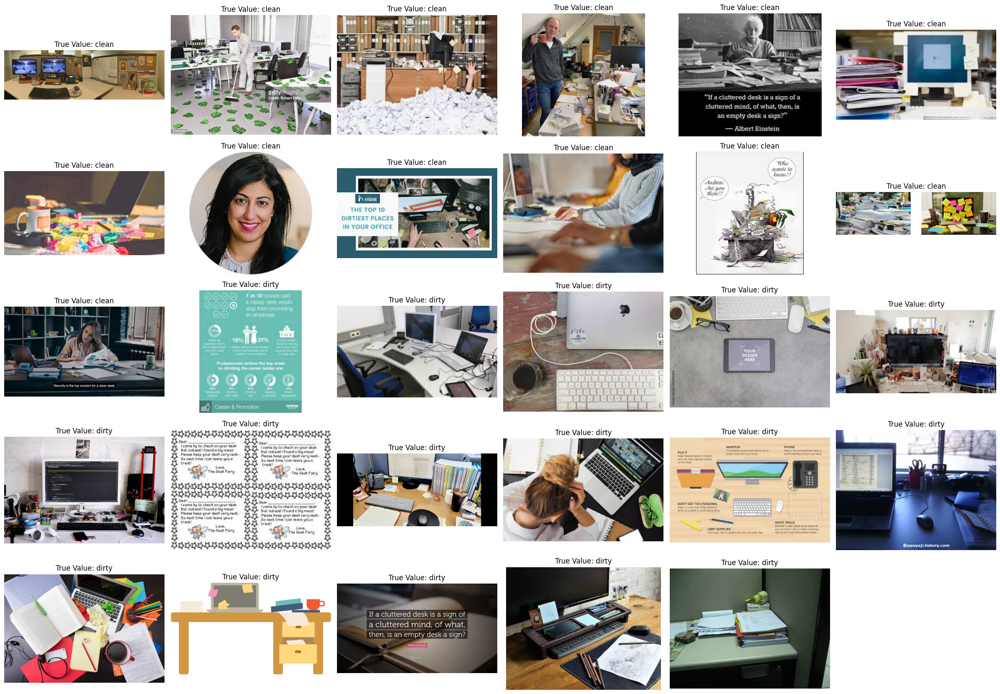

In [66]:
# test 데이터에서 틀린 것들

wrong_results = []

for i in range(len(test_generator.classes)):
    if test_generator.classes[i] != int(test_pred[i][0]):
        wrong_results.append(test_generator.filenames[i])

fig = plt.figure(1, figsize=(24,20))
cnt = 1
for filename in wrong_results:
    plt.subplot(6, 6, cnt)
    cnt += 1
    image = plt.imread('../data/desk/val/' + filename)
    plt.imshow(image)
    plt.axis('off')
    plt.title("True Value: "+ filename.split("/")[0])
    
plt.tight_layout()
plt.show()